<font color='orange'>**Please create your own copy before starting modification**</font>

In [377]:
pip install graphviz

Dependencies: Add Your dependencies here

In [378]:
import pandas as pd
import sklearn as sk
import numpy as np
from sklearn import tree
import graphviz as gp
import matplotlib.pyplot as plt

from sklearn.preprocessing import OrdinalEncoder as oe
from sklearn.model_selection import train_test_split as tts
from sklearn.model_selection import cross_val_score as cvs

from sklearn.tree import DecisionTreeClassifier as dtc
from sklearn.tree import DecisionTreeRegressor as dtr

from sklearn.metrics import mean_squared_error as mse
from mpl_toolkits.mplot3d import Axes3D

Code

<font color='red'>**Part 1**</font>

<font color='cyan'>**Dataset: The dataset represents the mood of a student to go to class depending on the weather at IIT Jodhpur. We have been accustomed to online classes so this is to give you folks a feeling of attending classes in the post COVID scenario.**</font>

A sample of the dataset is shown

In [379]:
dic = {'Time':'Morning','Temperature':'Hot','Friend_Attending':'No','Windy':'Yes','Attend':'Yes'}
df= pd.DataFrame(dic,index=[0])
df

,Time,Temperature,Friend_Attending,Windy,Attend
0,Morning,Hot,No,Yes,Yes


Read the complete data from the CSV file at link: "Add Link to CSV here"



In [380]:
ques_1 = pd.read_csv('/content/Data_Decision_Trees - Sheet1.csv')
ques_1.head()

,Time,Temperature,Friend_Attending,Windy,Attend
0,Morning,Hot,Yes,Low,No
1,Morning,Hot,Yes,High,No
2,Afternoon,Hot,Yes,Low,Yes
3,Evening,Warm,Yes,Low,Yes
4,Evening,Cool,No,Low,Yes


Distribution of Dataset according to its Features

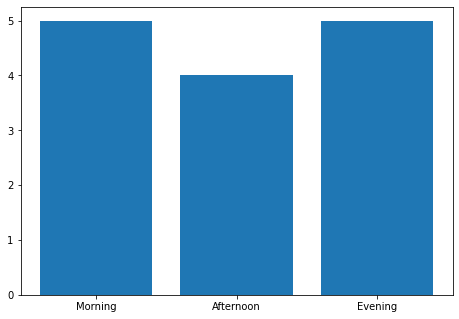

In [381]:
fig_i = plt.figure()
ax_i = fig_i.add_axes([0,0,1,1])
Time = ['Morning', 'Afternoon', 'Evening']

M = ques_1.apply(lambda x: True if x['Time'] == 'Morning' else False , axis=1)
M_R = len(M[M == True].index)
A = ques_1.apply(lambda x: True if x['Time'] == 'Afternoon' else False , axis=1)
A_R = len(A[A == True].index)
E = ques_1.apply(lambda x: True if x['Time'] == 'Evening' else False , axis=1)
E_R = len(E[E == True].index)

Rows = [M_R,A_R,E_R]
ax_i.bar(Time,Rows)
plt.show()

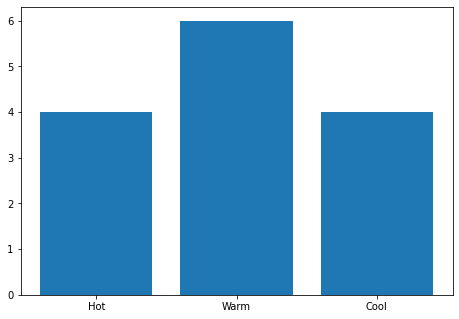

In [382]:
fig_ii = plt.figure()
ax_ii = fig_ii.add_axes([0,0,1,1])
Temperature = ['Hot', 'Warm', 'Cool']

H = ques_1.apply(lambda x: True if x['Temperature'] == 'Hot' else False , axis=1)
H_R = len(H[H == True].index)
W = ques_1.apply(lambda x: True if x['Temperature'] == 'Warm' else False , axis=1)
W_R = len(W[W == True].index)
C = ques_1.apply(lambda x: True if x['Temperature'] == 'Cool' else False , axis=1)
C_R = len(C[C == True].index)

Rows_ii = [H_R,W_R,C_R]
ax_ii.bar(Temperature,Rows_ii)
plt.show()

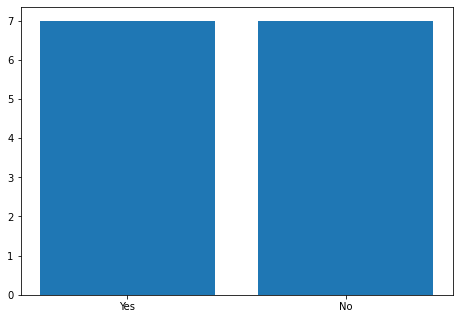

In [383]:
fig_iii = plt.figure()
ax_iii = fig_iii.add_axes([0,0,1,1])
Friend = ['Yes', 'No']

Y = ques_1.apply(lambda x: True if x['Friend_Attending'] == 'Yes' else False , axis=1)
Y_R = len(Y[Y == True].index)
N = ques_1.apply(lambda x: True if x['Friend_Attending'] == 'No' else False , axis=1)
N_R = len(N[N == True].index)

Rows_iii = [Y_R,N_R]
ax_iii.bar(Friend,Rows_iii)
plt.show()

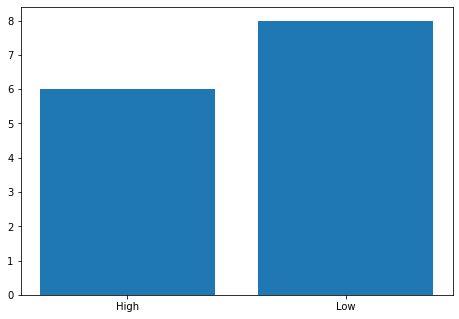

In [384]:
fig_iv = plt.figure()
ax_iv = fig_iv.add_axes([0,0,1,1])
Wind = ['High', 'Low']

h = ques_1.apply(lambda x: True if x['Windy'] == 'High' else False , axis=1)
h_R = len(h[h == True].index)
l = ques_1.apply(lambda x: True if x['Windy'] == 'Low' else False , axis=1)
l_R = len(l[l == True].index)

Rows_iv = [h_R,l_R]
ax_iv.bar(Wind,Rows_iv)
plt.show()

<font color='red'>**Part 2**</font>

Implement the same using Scikit Learn

Preprocessing

In [385]:
Ord_Encode = oe()
ques_1["Friend_Encoding"] = Ord_Encode.fit_transform(ques_1[["Friend_Attending"]])
ques_1["Windy_Encoding"] = Ord_Encode.fit_transform(ques_1[["Windy"]])
ques_1["Attend_Encoding"] = Ord_Encode.fit_transform(ques_1[["Attend"]])
ques_1["Time_Encoding"] = Ord_Encode.fit_transform(ques_1[["Time"]])
ques_1["Temperature_Encoding"] = Ord_Encode.fit_transform(ques_1[["Temperature"]])

X = ['Time_Encoding','Temperature_Encoding','Friend_Encoding','Windy_Encoding']
Y = ['Attend_Encoding']

ques_1.head()

,Time,Temperature,Friend_Attending,Windy,Attend,Friend_Encoding,Windy_Encoding,Attend_Encoding,Time_Encoding,Temperature_Encoding
0,Morning,Hot,Yes,Low,No,1.0,1.0,0.0,2.0,1.0
1,Morning,Hot,Yes,High,No,1.0,0.0,0.0,2.0,1.0
2,Afternoon,Hot,Yes,Low,Yes,1.0,1.0,1.0,0.0,1.0
3,Evening,Warm,Yes,Low,Yes,1.0,1.0,1.0,1.0,2.0
4,Evening,Cool,No,Low,Yes,0.0,1.0,1.0,1.0,0.0


Shuffle the data frame

In [386]:
ques_1 = ques_1.sample(frac=1)

Take two for testing and rest for training

In [387]:
x_train , x_test , y_train , y_test = tts(ques_1[X],ques_1[Y],test_size = 0.1)

Display Training

In [388]:
print(x_train)
print(y_train)

    Time_Encoding  Temperature_Encoding  Friend_Encoding  Windy_Encoding
6             0.0                   0.0              0.0             0.0
7             2.0                   2.0              1.0             1.0
3             1.0                   2.0              1.0             1.0
12            0.0                   1.0              0.0             1.0
10            2.0                   2.0              0.0             0.0
2             0.0                   1.0              1.0             1.0
13            1.0                   2.0              1.0             0.0
8             2.0                   0.0              0.0             1.0
9             1.0                   2.0              0.0             1.0
0             2.0                   1.0              1.0             1.0
1             2.0                   1.0              1.0             0.0
5             1.0                   0.0              0.0             0.0
    Attend_Encoding
6               1.0
7          

Display Testing

In [389]:
print(x_test)
print(y_test)

    Time_Encoding  Temperature_Encoding  Friend_Encoding  Windy_Encoding
11            0.0                   2.0              1.0             0.0
4             1.0                   0.0              0.0             1.0
    Attend_Encoding
11              1.0
4               1.0


Given the follwing data construct a decision tree using Entropy

In [390]:
model = dtc(criterion = "entropy")
model.fit(x_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

Fit the classifier using Gini Impurity

In [391]:
model_ii = dtc(criterion = "gini")
model_ii.fit(x_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

Print the cross validation score with folds = 5

Data for Decision Tree Classifier with Entropy
[0.66666667 0.66666667 1.         0.5        0.5       ]
Accuracy =  66.66666666666666
Standard Deviation =  0.18257418583505536

Data for Decision Tree Classifier with Gini
[0.33333333 0.33333333 1.         0.5        0.5       ]
Accuracy =  53.333333333333336
Standard Deviation =  0.24494897427831783
 


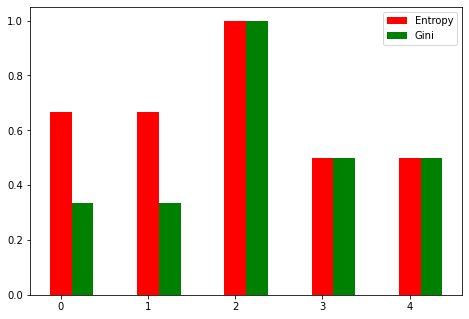

In [392]:
score_i = cvs(model,x_train,y_train)
print("Data for Decision Tree Classifier with Entropy")
print(score_i)
print("Accuracy = ",score_i.mean()*100)
print("Standard Deviation = ",score_i.std())

score_ii = cvs(model_ii,x_train,y_train)
print("\nData for Decision Tree Classifier with Gini")
print(score_ii)
print("Accuracy = ",score_ii.mean()*100)
print("Standard Deviation = ",score_ii.std())
print(" ")

data = [score_i,score_ii]
X_plot = np.arange(5)
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.bar(X_plot + 0.00, data[0], color = 'r', width = 0.25)
ax.bar(X_plot + 0.25, data[1], color = 'g', width = 0.25)
ax.legend(labels=['Entropy','Gini'])
plt.show()

Print the depth of the decison Tree

In [393]:
print('Depth of Decision Tree Classifier with Entropy = ', model.get_depth())
print('Depth of Decision Tree Classifier with Gini = ',model_ii.get_depth())

Depth of Decision Tree Classifier with Entropy =  4
Depth of Decision Tree Classifier with Gini =  4


Print the number of leaves in the decision Tree

In [394]:
print('Number of Leave Nodes in Decision Tree Classifier with Entropy = ',model.get_n_leaves())
print('Number of Leave Nodes in Decision Tree Classifier with Gini = ',model_ii.get_n_leaves())

Number of Leave Nodes in Decision Tree Classifier with Entropy =  7
Number of Leave Nodes in Decision Tree Classifier with Gini =  7


Return the index of the leaf that each sample is predicted as.



In [395]:
print('Indexes of Samples, predicted by Decision Tree Classifier with Entropy = ',model.apply(x_train))
print('Indexes of Samples, predicted by Decision Tree Classifier with Gini = ',model_ii.apply(x_train))

Indexes of Samples, predicted by Decision Tree Classifier with Entropy =  [ 1 12 11  1  6  1 10  7  7 12 12  5]
Indexes of Samples, predicted by Decision Tree Classifier with Gini =  [ 3 12 11  7  7 11 10  6  7 12 12  5]


Print the decision path

In [396]:
print("Decision Path of each sample, predicted by Decision Tree Classifier with Entropy :-")
print(model.decision_path(x_test))
print(" ")
print("Decision Path of each sample, predicted by Decision Tree Classifier with Gini :-")
print(model_ii.decision_path(x_test))

Decision Path of each sample, predicted by Decision Tree Classifier with Entropy :-
  (0, 0)	1
  (0, 1)	1
  (1, 0)	1
  (1, 2)	1
  (1, 3)	1
  (1, 7)	1
 
Decision Path of each sample, predicted by Decision Tree Classifier with Gini :-
  (0, 0)	1
  (0, 8)	1
  (0, 9)	1
  (0, 10)	1
  (1, 0)	1
  (1, 1)	1
  (1, 2)	1
  (1, 4)	1
  (1, 5)	1


Print the gini impurity of each feature

In [397]:
result = model.feature_importances_
print("Gini Impurity of each features of Decision Tree Classifier with Entropy")
for i,v in enumerate(result):
	print('Feature: %0d, Score: %.5f' % (i,v))
print(" ")
print("Gini Impurity of each features of Decision Tree Classifier with Gini")
result_ii = model_ii.feature_importances_
for i,v in enumerate(result_ii):
	print('Feature: %0d, Score: %.5f' % (i,v))

Gini Impurity of each features of Decision Tree Classifier with Entropy
Feature: 0, Score: 0.37831
Feature: 1, Score: 0.17009
Feature: 2, Score: 0.17561
Feature: 3, Score: 0.27598
 
Gini Impurity of each features of Decision Tree Classifier with Gini
Feature: 0, Score: 0.45714
Feature: 1, Score: 0.05714
Feature: 2, Score: 0.25714
Feature: 3, Score: 0.22857


Training Accuracy

In [398]:
print("Training Accuracy for Decision Tree Classifier with Entropy = ",model.score(x_train,y_train)*100)
print("Training Accuracy for Decision Tree Classifier with Gini = ",model_ii.score(x_train,y_train)*100)

Training Accuracy for Decision Tree Classifier with Entropy =  100.0
Training Accuracy for Decision Tree Classifier with Gini =  100.0


Testing accuracy

In [399]:
print("Test Accuracy for Decision Tree Classifier with Entropy = ",model.score(x_test,y_test)*100)
print("Test Accuracy for Decision Tree Classifier with Gini = ",model_ii.score(x_test,y_test)*100)

Test Accuracy for Decision Tree Classifier with Entropy =  100.0
Test Accuracy for Decision Tree Classifier with Gini =  0.0


Map the query: [Time: Morning, Temperature: Warm, Friend_Attending: No, 'Wind': Low] to the correct numerical value as the training and the predict the output.

In [400]:
sample = {'Time':'Morning','Temperature':'Warm','Friend_Attending':'No','Windy':'Low'}
df_sample= pd.DataFrame(sample,index=[0])
cleans={'Friend_Attending':{'Yes':1.0,'No':0.0},'Windy':{'Low':1.0,'High':0.0},'Time':{'Morning':2.0,'Afternoon':0.0,'Evening':1.0},'Temperature':{'Hot':1.0,'Warm':2.0,'Cool':0.0}}
df_sample = df_sample.replace(cleans)
df_sample = df_sample.rename(columns={"Time": "Time_Encoding", "Temperature": "Temperature_Encoding", "Friend_Attending": "Friend_Encoding", "Windy": "Windy_Encoding"})
y_pred_sample=model.predict(df_sample)
if (y_pred_sample == 1.0):
  print("Yes")
else:
  print("No")

Yes


<font color='red'>**Part 3**</font>

Plot the decision tree

Decision Tree Classifier Plot with Entropy


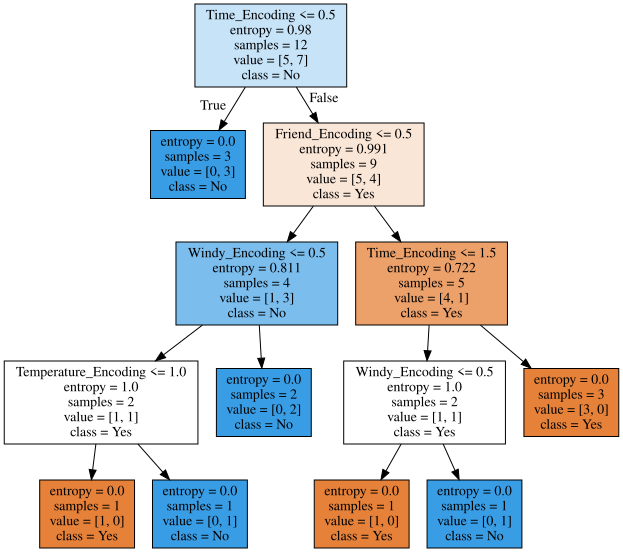

In [401]:
print("Decision Tree Classifier Plot with Entropy")
# DOT data
dot_data_i = tree.export_graphviz(model,out_file=None,feature_names=X,class_names=['Yes','No'],filled=True)
# Draw graph
graph_i = gp.Source(dot_data_i, format="png")
graph_i.render("decision_tree_entropy") 
graph_i

Decision Tree Classifier Plot with Gini


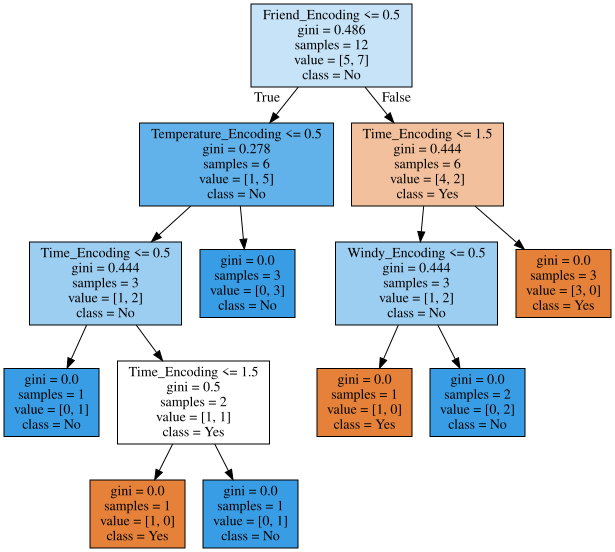

In [402]:
print("Decision Tree Classifier Plot with Gini")
# DOT data
dot_data_ii = tree.export_graphviz(model_ii,out_file=None,feature_names=X,class_names=['Yes','No'],filled=True)
# Draw graph
graph_ii= gp.Source(dot_data_ii, format="png") 
graph_ii.render("decision_tree_gini")
graph_ii

Plot the decision surface

(-1.0, 1.9900000000000029, -1.0, 1.9900000000000029)

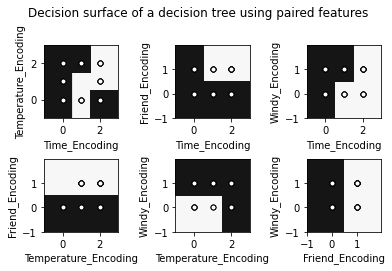

In [403]:
# Parameters
n_classes = 2
plot_colors = "bw"
plot_step = 0.01

for pairidx, pair in enumerate([[0, 1], [0, 2], [0, 3],
                                [1, 2], [1, 3], [2, 3]]):
    # We only take the two corresponding features
    x = ques_1.loc[:,[X[pair[0]],X[pair[1]]]]
    y = ques_1.loc[:,Y]

    # Train
    clf = model.fit(x, y)

    # Plot the decision boundary
    plt.subplot(2, 3, pairidx + 1)

    x_min, x_max = x.iloc[:, 0].min() - 1, x.iloc[:, 0].max() + 1
    y_min, y_max = x.iloc[:, 1].min() - 1, x.iloc[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, plot_step),
                         np.arange(y_min, y_max, plot_step))
    plt.tight_layout(h_pad=0.5, w_pad=0.5, pad=2.5)

    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    cs = plt.contourf(xx, yy, Z, cmap='Greys')

    plt.xlabel(X[pair[0]])
    plt.ylabel(X[pair[1]])

    # Plot the training points
    for i, color in zip(range(n_classes), plot_colors):
        idx = ques_1.where(y == i)
        plt.scatter(x.iloc[list(idx.index.values), 0], x.iloc[list(idx.index.values), 1], c=color,
                    cmap='Greys', edgecolor='black', s=25)

plt.suptitle("Decision surface of a decision tree using paired features")
plt.axis("tight")

(-1.0, 1.9900000000000029, -1.0, 1.9900000000000029)

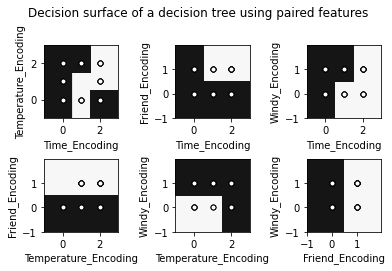

In [404]:
# Parameters
n_classes = 2
plot_colors = "bw"
plot_step = 0.01

for pairidx, pair in enumerate([[0, 1], [0, 2], [0, 3],
                                [1, 2], [1, 3], [2, 3]]):
    # We only take the two corresponding features
    x = ques_1.loc[:,[X[pair[0]],X[pair[1]]]]
    y = ques_1.loc[:,Y]

    # Train
    clf = model_ii.fit(x, y)

    # Plot the decision boundary
    plt.subplot(2, 3, pairidx + 1)

    x_min, x_max = x.iloc[:, 0].min() - 1, x.iloc[:, 0].max() + 1
    y_min, y_max = x.iloc[:, 1].min() - 1, x.iloc[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, plot_step),
                         np.arange(y_min, y_max, plot_step))
    plt.tight_layout(h_pad=0.5, w_pad=0.5, pad=2.5)

    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    cs = plt.contourf(xx, yy, Z, cmap='Greys')

    plt.xlabel(X[pair[0]])
    plt.ylabel(X[pair[1]])

    # Plot the training points
    for i, color in zip(range(n_classes), plot_colors):
        idx = ques_1.where(y == i)
        plt.scatter(x.iloc[list(idx.index.values), 0], x.iloc[list(idx.index.values), 1], c=color,
                    cmap='Greys', edgecolor='black', s=25)

plt.suptitle("Decision surface of a decision tree using paired features")
plt.axis("tight")

<font color='magenta'>**Part 04: Not Compulsory**</font>

Advanced: Can you implement the partitioning of the decision tree using the following algorithm

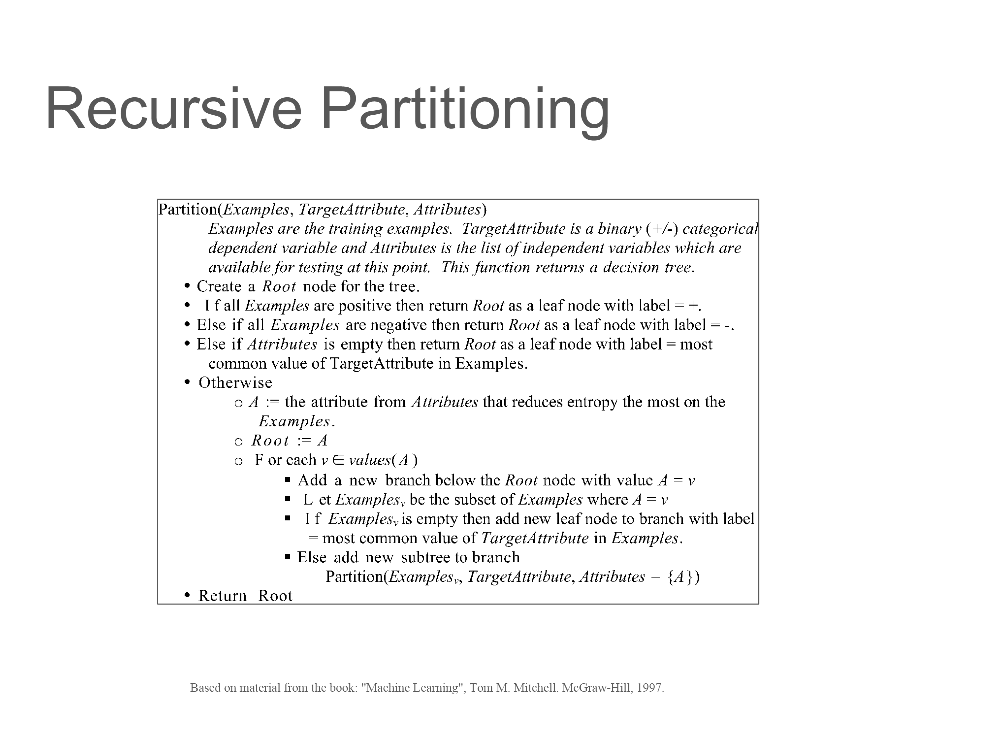

Part 5: Building Decision Trees when the data is of a continuous nature

In the previous case the nodes were broken based on entropy/gini impurity. In the case of regression the mean sqaured error is the decsion parameter for splitting the nodes. The following dataset contains continuous data and we need to use decision trees with regression.

Read the dataset

In [405]:
ques_2 = pd.read_csv('/content/death.csv',na_values=["**","*"])
Original=ques_2.shape[0]
ques_2.head()

,County,FIPS,Met Objective of 45.5? (1),Age-Adjusted Death Rate,Lower 95% Confidence Interval for Death Rate,Upper 95% Confidence Interval for Death Rate,Average Deaths per Year,Recent Trend (2),Recent 5-Year Trend (2) in Death Rates,Lower 95% Confidence Interval for Trend,Upper 95% Confidence Interval for Trend
0,United States,0,No,46.0,45.9,46.1,"1,57,376",falling,-2.4,-2.6,-2.2
1,"Perry County, Kentucky",21193,No,125.6,108.9,144.2,43,stable,-0.6,-2.7,1.6
2,"Powell County, Kentucky",21197,No,125.3,100.2,155.1,18,stable,1.7,0.0,3.4
3,"North Slope Borough, Alaska",2185,No,124.9,73.0,194.7,5,NaN,NaN,NaN,NaN
4,"Owsley County, Kentucky",21189,No,118.5,83.1,165.5,8,stable,2.2,-0.4,4.8


Preprocess the dataset to remove all the rows with empty column values

In [406]:
ques_2 = ques_2.dropna()
Preprocessed=ques_2.shape[0]

Distribution of Dataset according to NaN Values

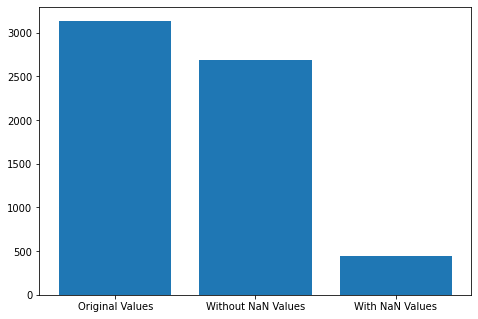

In [407]:
Na_valued = Original-Preprocessed
fig_vi = plt.figure()
ax_vi = fig_vi.add_axes([0,0,1,1])
Distribution = ['Original Values','Without NaN Values', 'With NaN Values']
Val = [Original,Preprocessed,Na_valued]
ax_vi.bar(Distribution,Val)
plt.show()

Distribution of Dataset according to some Categories

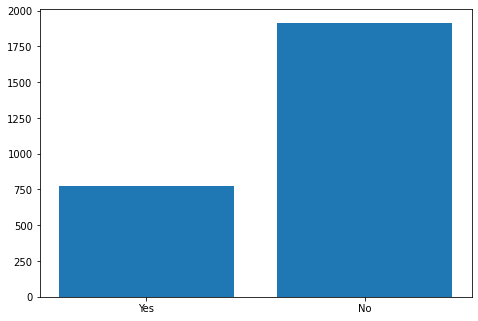

In [408]:
fig_vii = plt.figure()
ax_vii = fig_vii.add_axes([0,0,1,1])
Bool_Val = ['Yes', 'No']

y = ques_2.apply(lambda x: True if x['Met Objective of 45.5? (1)'] == 'Yes' else False , axis=1)
y_R = len(y[y == True].index)
n = ques_2.apply(lambda x: True if x['Met Objective of 45.5? (1)'] == 'No' else False , axis=1)
n_R = len(n[n == True].index)

Rows_vii = [y_R,n_R]
ax_vii.bar(Bool_Val,Rows_vii)
plt.show()

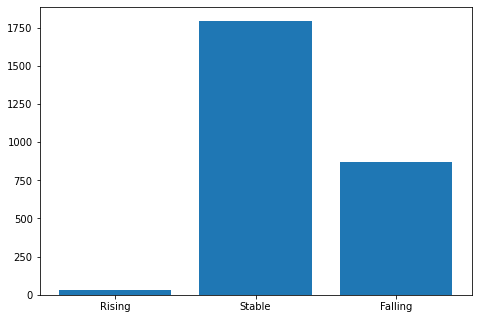

In [409]:
fig_viii = plt.figure()
ax_viii = fig_viii.add_axes([0,0,1,1])
category_val = ['Rising', 'Stable', 'Falling']

r = ques_2.apply(lambda x: True if x['Recent Trend (2)'] == 'rising' else False , axis=1)
r_R = len(r[r == True].index)
s = ques_2.apply(lambda x: True if x['Recent Trend (2)'] == 'stable' else False , axis=1)
s_R = len(s[s == True].index)
f = ques_2.apply(lambda x: True if x['Recent Trend (2)'] == 'falling' else False , axis=1)
f_R = len(f[f == True].index)

Rows_viii = [r_R,s_R,f_R]
ax_viii.bar(category_val,Rows_viii)
plt.show()

Convert Categorical Values to numerical

In [410]:
convert = oe()
ques_2["recent_trend_(2)_encoding"]=convert.fit_transform(ques_2[["Recent Trend (2)"]])
ques_2["met_objective_of_45.5?_(1)_encoding"]=convert.fit_transform(ques_2[["Met Objective of 45.5? (1)"]])
ques_2['Average Deaths per Year'] = ques_2['Average Deaths per Year'].str.replace(",","")
ques_2['Average Deaths per Year'] = ques_2['Average Deaths per Year'].astype(float)

Split the dataset into train and test(Based on split size)

In [411]:
X=["FIPS","met_objective_of_45.5?_(1)_encoding","Age-Adjusted Death Rate","Lower 95% Confidence Interval for Death Rate","Upper 95% Confidence Interval for Death Rate","Average Deaths per Year","recent_trend_(2)_encoding","Recent 5-Year Trend (2) in Death Rates","Lower 95% Confidence Interval for Trend"]
Y=["Upper 95% Confidence Interval for Trend"]
x_tr , x_te , y_tr , y_te = tts(ques_2[X],ques_2[Y],test_size = 0.1)

Perform the decision tree regression

In [412]:
model = dtr()
model.fit(x_tr,y_tr)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

Some Details about Decision Tree Regression Model

In [413]:
print('Depth of Decision Tree Regressor = ', model.get_depth())
print('Number of Leave Nodes in Decision Tree Regressor = ',model.get_n_leaves())
print(" ")
result = model.feature_importances_
print("Gini Impurity of each features of Decision Tree Regressor")
for i,v in enumerate(result):
	print('Feature: %0d, Score: %.5f' % (i,v))

Depth of Decision Tree Regressor =  23
Number of Leave Nodes in Decision Tree Regressor =  1551
 
Gini Impurity of each features of Decision Tree Regressor
Feature: 0, Score: 0.00112
Feature: 1, Score: 0.00002
Feature: 2, Score: 0.00762
Feature: 3, Score: 0.00039
Feature: 4, Score: 0.01052
Feature: 5, Score: 0.17971
Feature: 6, Score: 0.12490
Feature: 7, Score: 0.60697
Feature: 8, Score: 0.06875


Print Cross Validation Score with folds=5

Data for Decision Tree Regressor
[0.44794638 0.32608145 0.45209941 0.84795296 0.38829155]
Accuracy =  49.24743483898558
Standard Deviation =  0.1835857132013507


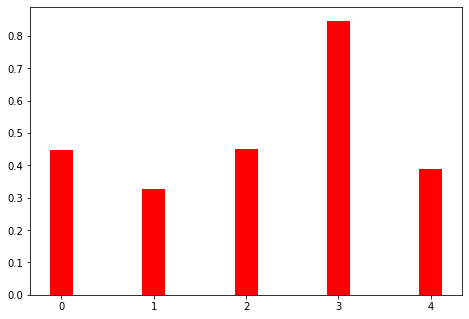

In [414]:
score = cvs(model,x_tr,y_tr)
print("Data for Decision Tree Regressor")
print(score)
print("Accuracy = ",score.mean()*100)
print("Standard Deviation = ",score.std())

X_plot = np.arange(5)
fig_v = plt.figure()
ax_v = fig_v.add_axes([0,0,1,1])
ax_v.bar(X_plot + 0.00,score, color = 'r', width = 0.25)
plt.show()

Predict on test dataset

In [415]:
y_pred = model.predict(x_te)

Calculate Squared Error between predicted and real values

In [416]:
print("Mean Squared Error = ",mse(y_te,y_pred))

Mean Squared Error =  0.13040740740740742


Plot the Decision Tree

In [417]:
dot_data = tree.export_graphviz(model, out_file=None,feature_names=X,filled=True)
graph = gp.Source(dot_data, format="png")
graph.render("decision_tree_regressor_graphivz")
graph

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.208889 to fit


Plot the Decision Surface 

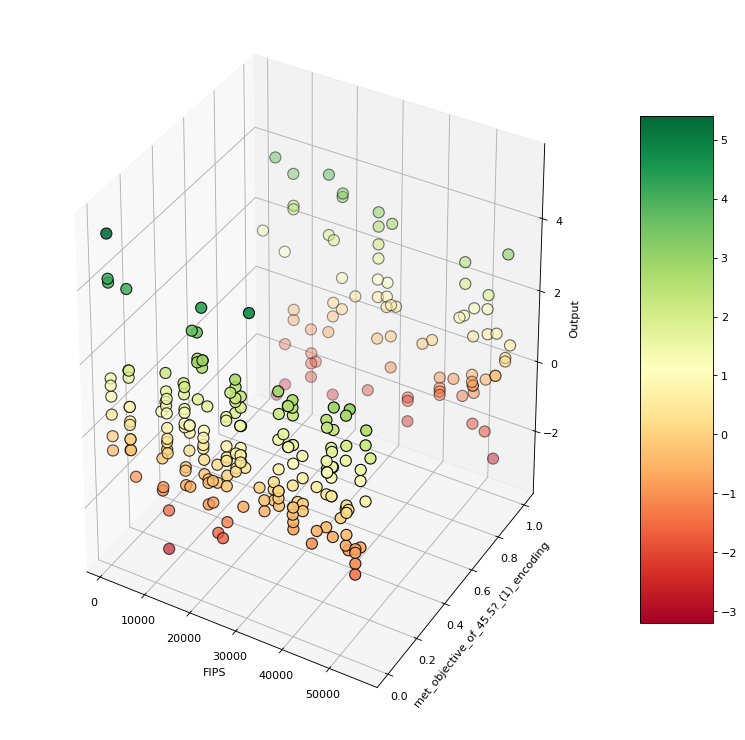

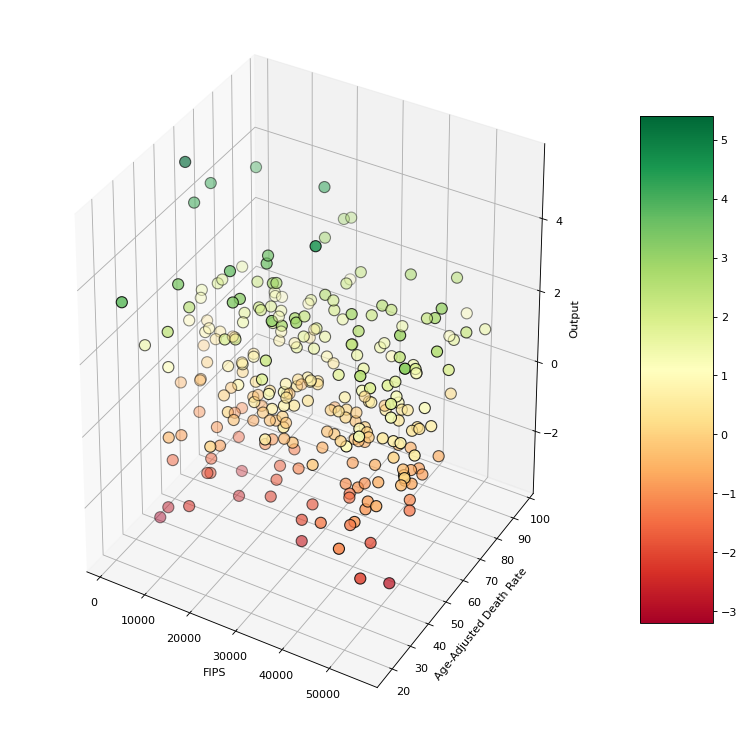

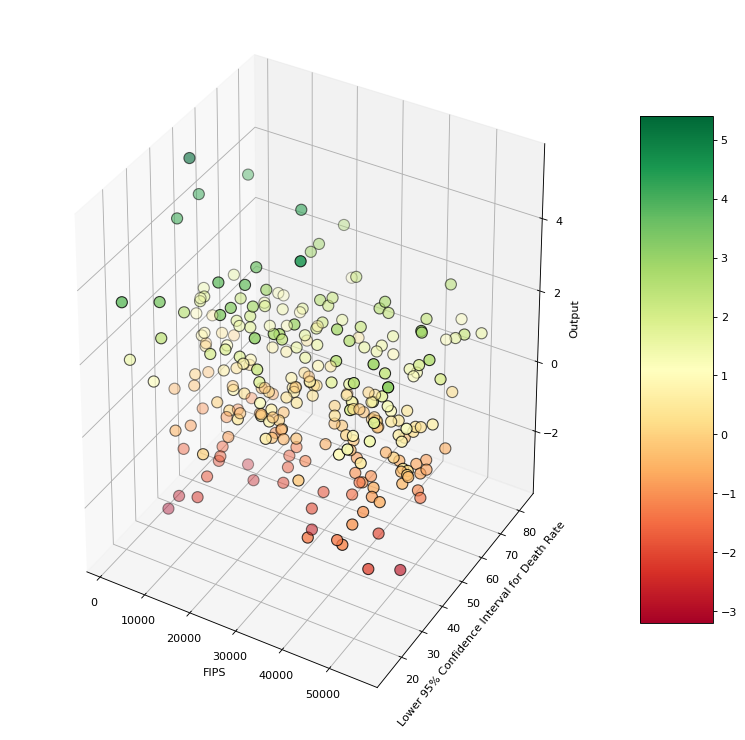

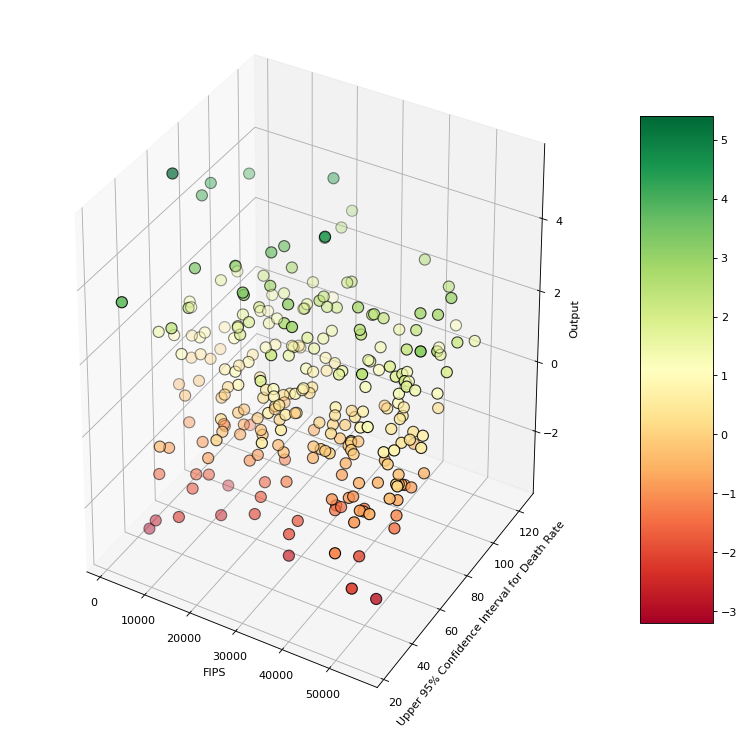

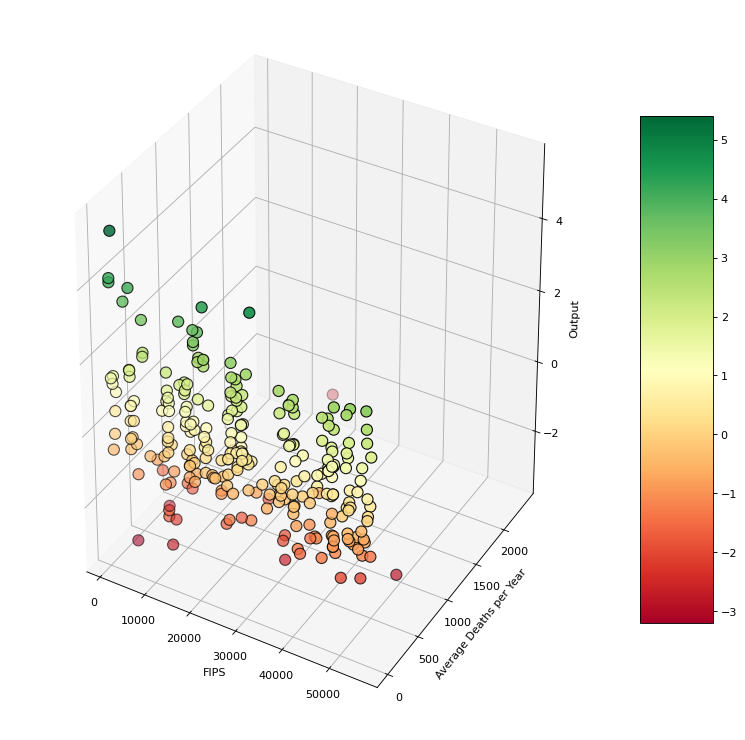

...

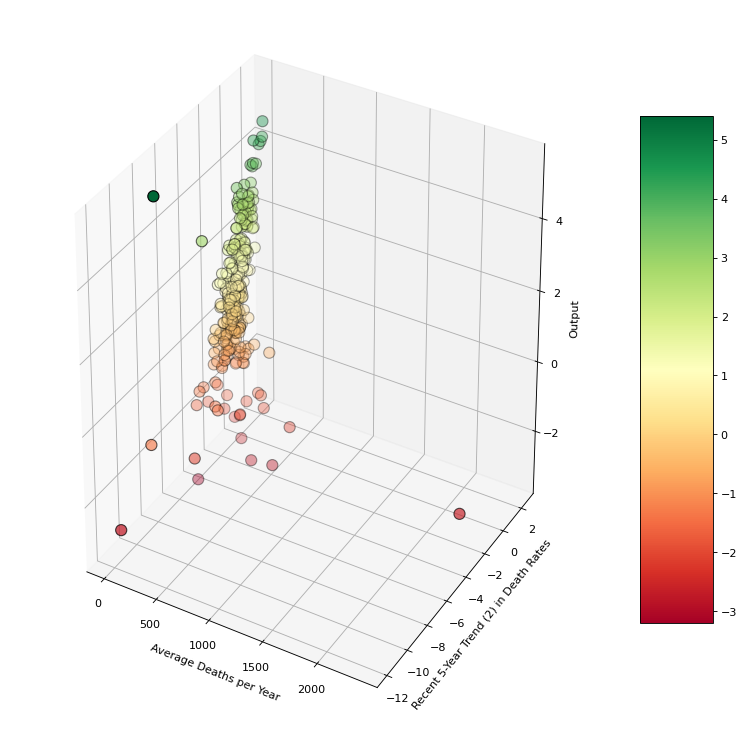

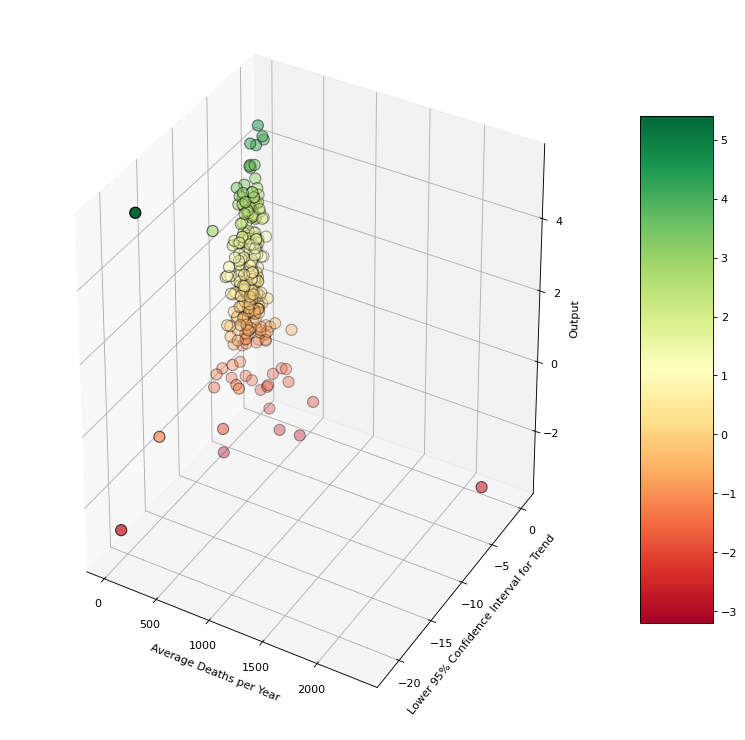

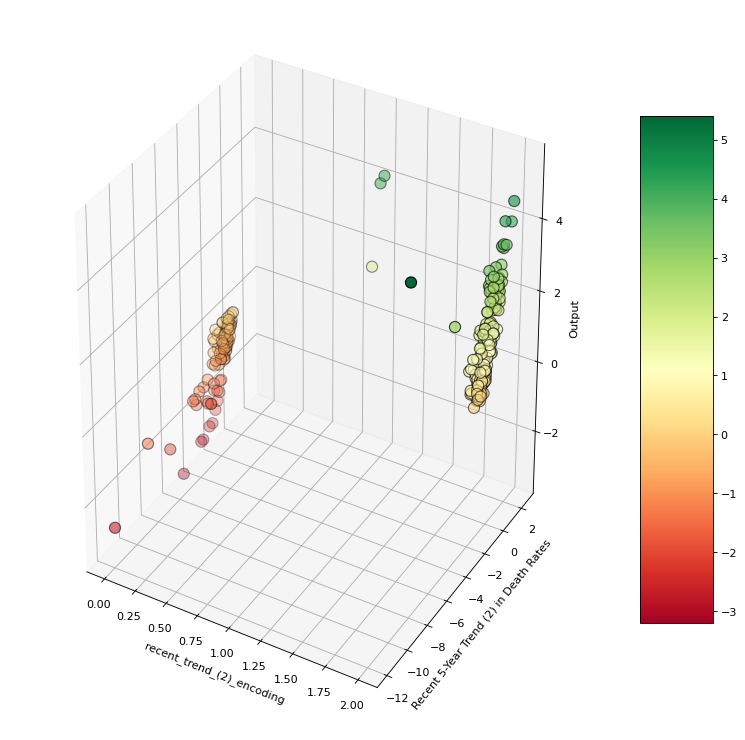

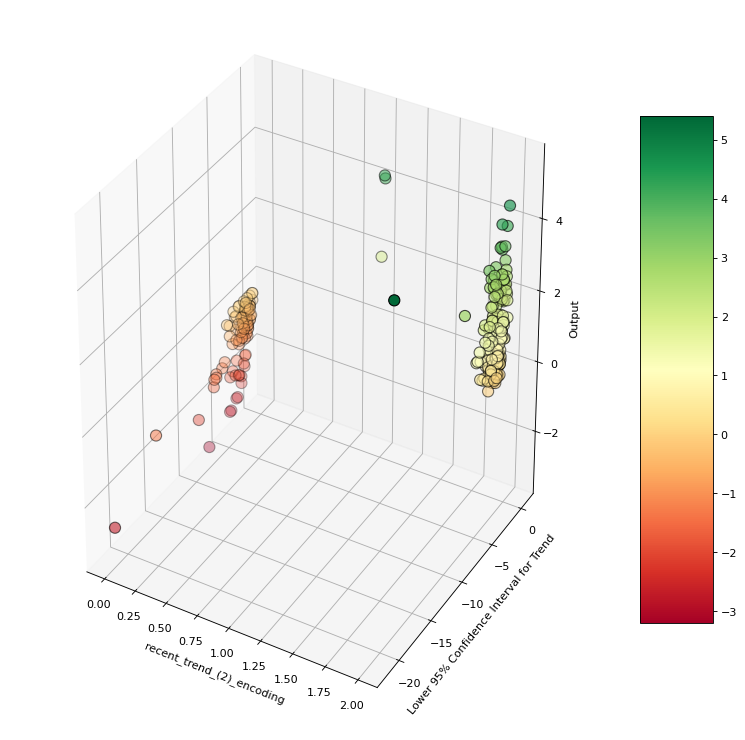

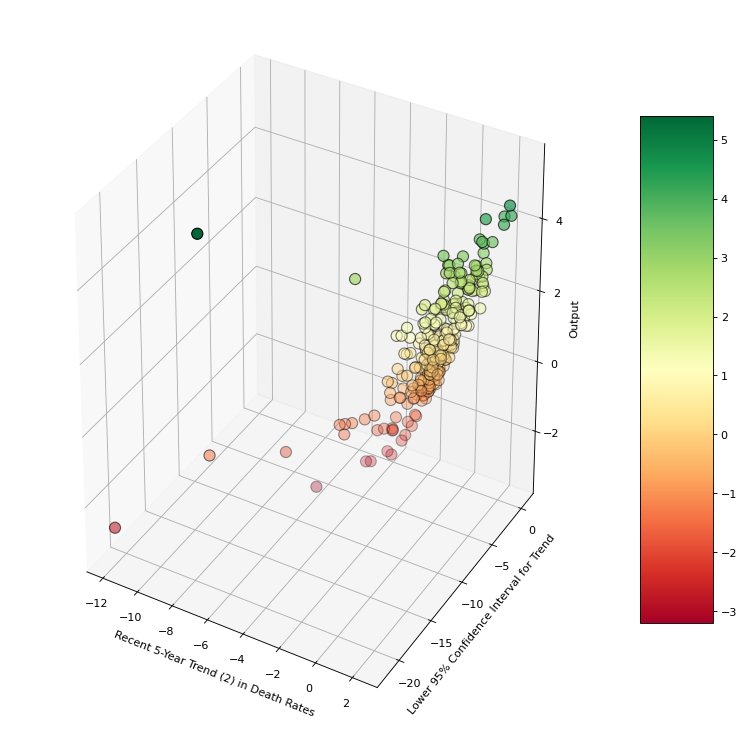

In [424]:
for i in range(0,8):
  for j in range(i+1,9):
    fig = plt.figure(figsize = (12, 12), dpi=80)
    ax = fig.add_subplot(111, projection='3d')
    pnt3d = ax.scatter3D(x_te[X[i]],x_te[X[j]],y_pred, c=y_pred, cmap="RdYlGn",s=100, edgecolors="black")
    fig.colorbar(pnt3d, ax = ax, shrink = 0.7, aspect = 7) 
    fig.set_facecolor('white')
    ax.set_facecolor('white')
    ax.set_xlabel(X[i])
    ax.set_zlabel('Output')
    ax.set_ylabel(X[j])
    plt.show()
    #ax = ques_2.plot.scatter(x=X[i],y=X[j],c='Black')



<font color='green'>**References**</font>



*   [Ref1](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html)

*   [Ref2](https://pbpython.com/categorical-encoding.html)


*   [Ref3](https://mljar.com/blog/visualize-decision-tree/)


*   [Ref4](https://scikit-learn.org/stable/auto_examples/tree/plot_iris_dtc.html#sphx-glr-auto-examples-tree-plot-iris-dtc-py)


*   [Ref5](https://scikit-learn.org/stable/auto_examples/tree/plot_tree_regression.html)

*   [Ref6](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.mean_squared_error.html)